In [1]:
import pandas as pd
import numpy as np
import matplotlib.pyplot as plt
%matplotlib inline
import seaborn as sns



In [174]:
import pandas as pd
import datetime as dt
import seaborn as sns
sns.set(style='darkgrid')
from matplotlib.pylab import rcParams
# plt.style.use('fivethirtyeight')
import sqlite3
import numpy as np
import plotly.express as px
from datetime import datetime as dt
from statsmodels.graphics.tsaplots import plot_pacf
from statsmodels.graphics.tsaplots import plot_acf
from statsmodels.tsa.arima_model import ARMA
import statsmodels.api as sm
from sklearn.metrics import mean_squared_error
from math import sqrt
from statsmodels.tsa.statespace.sarimax import SARIMAX
import sqlite3
from statsmodels.tsa.stattools import adfuller , acf , pacf
import math
from statsmodels.formula.api import ols
import matplotlib.pyplot as plt 
import plotly.express as px
import plotly.graph_objects as go
% matplotlib inline
from matplotlib.pylab import rcParams
rcParams['figure.figsize'] = 10,6
import warnings
warnings.filterwarnings('ignore')
from functions import *

In [173]:
from functions import *
# pizza_function()

# Non-stationarity - Also there is Non-stationarity in the pattens.
- Increasing trend leads to non-constant mean
- Covariance is non constant with time
- There is non-constant variance

# Stationarity Check :

### Rolling Statistics - Visually stationarity check
- It is also called the moving average
- It is the unweighted mean of the last n values
- it can find trends that are hard to detect.

### Dickey Fuller Test - Statisitical Stationarity Check 
- Checks the null hypothesis ($H_{0}$) by checking that the time series has root and is stationary else it rejects the  null
  hypothesis - $H_{0}$ 
- Checks for the condition if test statistic is less than critical value: Reject $H_{0}$ .  

# Removal of Non Stationarity
- Differencing
- Decomposition

### note : test Stats are made as close to stationary as possible using these techniques



In [3]:
!pip install pyMouse

In [4]:
import fbprophet
print(fbprophet.__version__)

0.6


In [5]:
from fbprophet import Prophet as pr

# Connecting to SQL Database

In [176]:
con = sqlite3.connect("flightdatabase.db" , detect_types=sqlite3.PARSE_COLNAMES)
cur = con.cursor()

In [180]:
cur.execute("""SELECT name from sqlite_master WHERE type = 'table';""")
tables = cur.fetchall()
tables = [i[0] for i in tables]

In [181]:
# checking if database works
cur.execute("""SELECT name
               FROM sqlite_master
               WHERE type = 'table'
               ORDER BY name
;""").fetchall()

[('finalflights',)]

In [185]:
df1 = create_dataframe_from_SQL("""Select * from finalflights where year < 2019;""")
df1

,field1,ds,city,PASSENGERS,Type,Month,Year,temperature_mean,precipitation,rain_days,pressure,cost_of_living_index,population,city_ascii,lat,lng,country,iso2,iso3
0,0,2010-01-01,Atlanta,2735491,Domestic,1,2010,3.6,137.0,7.0,1019.50,100.99,429193.0,Atlanta,33.7627,-84.4225,United States,US,USA
1,1,2010-01-01,Washington,1929494,Domestic,1,2010,0.4,57.0,8.0,1016.70,98.19,605085.0,Washington,38.9047,-77.0163,United States,US,USA
2,2,2010-01-01,Singapore,1681005,International,1,2010,27.5,70.0,8.0,1011.60,65.94,5074252.0,Singapore,1.2930,103.8558,Singapore,SG,SGP
3,3,2010-01-01,Berlin,489487,International,1,2010,-4.9,21.0,7.0,1014.78,115.24,3450395.0,Berlin,52.5218,13.4015,Germany,DE,DEU
4,4,2010-01-01,Paris,4154249,International,1,2010,0.6,36.0,7.0,1015.60,130.30,10460118.0,Paris,48.8667,2.3333,France,FR,FRA
...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...,...
4963,4963,2018-12-01,New York City,3794306,Domestic,12,2018,4.7,175.0,11.0,1019.10,100.00,8398748.0,New York City,40.6943,-73.9249,United States,US,USA
4964,4964,2018-12-01,Minneapolis,1295947,Domestic,12,2018,-3.3,39.0,4.0,1018.50,81.46,425403.0,Minneapolis,44.9635,-93.2678,United States,US,USA
4965,4965,2018-12-01,Los Angeles,3491734,Domestic,12,2018,14.8,37.0,2.0,1017.90,82.30,3990456.0,Los Angeles,34.1139,-118.4068,United States,US,USA
4966,4966,2018-12-01,Los Angeles,3491734,Domestic,12,2018,14.8,37.0,2.0,1017.90,82.30,3990456.0,Los Angeles,-37.4600,-72.3600,Chile,CL,CHL


In [ ]:
# cur.execute("""Select * from finalflights where year < 2019;""")
# df1 = pd.DataFrame(cur.fetchall())
# df1.columns = [x[0] for x in cur.description]
# df1.head()

In [8]:
#convert date to datetime
df1['ds'] =  pd.to_datetime(df1['ds'])

# Differencing :

In [10]:
from statsmodels.tsa.seasonal import seasonal_decompose

In [11]:
total_monthly = pd.DataFrame(df1.groupby('ds')['PASSENGERS', 'temperature_mean'].sum())
total_monthly.head()

,PASSENGERS,temperature_mean
ds,,
2010-01-01,74137239,350.7
2010-02-01,70304808,403.2
2010-03-01,85270257,582.0
2010-04-01,80722258,746.0
2010-05-01,86987700,893.8


In [12]:
moving_average = total_monthly.rolling(window=12, min_periods=3).mean()
moving_average.head()

,PASSENGERS,temperature_mean
ds,,
2010-01-01,NaN,NaN
2010-02-01,NaN,NaN
2010-03-01,76570768.0,445.300
2010-04-01,77608640.5,520.475
2010-05-01,79484452.4,595.140


In [13]:
cities = df1['city'].unique()
cities

array(['Atlanta', 'Washington', 'Singapore', 'Berlin', 'Paris', 'Dubai',
       'Reykjavik', 'Croatia', 'Athens', 'Hong Kong', 'Seoul', 'Phuket',
       'Amsterdam', 'Taipei', 'Barcelona', 'Rome', 'London', 'Tokyo',
       'Tampa', 'St. Louis', 'Delhi', 'San Francisco', 'Charlotte',
       'Chicago', 'Salt Lake City', 'Portland', 'Phoenix', 'Philadelphia',
       'Orlando', 'Boston', 'New York City', 'Miami', 'Los Angeles',
       'Las Vegas', 'Houston', 'Dallas', 'Denver', 'Honolulu',
       'Minneapolis', 'Seattle', 'Detroit', 'San Diego'], dtype=object)

In [14]:
df_croatia = df1[df1['city'] == 'Croatia']
df_croatia = df_croatia.rename(columns={'PASSENGERS': 'y'})
df_croatia.head()

,field1,ds,city,y,Type,Month,Year,temperature_mean,precipitation,rain_days,pressure,cost_of_living_index,population,city_ascii,lat,lng,country,iso2,iso3
7,7,2010-01-01,Croatia,165000,International,1,2010,6.8,140.0,12.0,1011.5,75.6,798966.0,Croatia,45.8,16.0,Croatia,HR,HRV
52,52,2010-02-01,Croatia,145000,International,2,2010,8.5,164.0,16.0,1006.9,75.6,798966.0,Croatia,45.8,16.0,Croatia,HR,HRV
104,104,2010-03-01,Croatia,199000,International,3,2010,10.6,69.0,8.0,1016.6,75.6,798966.0,Croatia,45.8,16.0,Croatia,HR,HRV
148,148,2010-04-01,Croatia,267000,International,4,2010,15.4,88.0,10.0,1016.0,75.6,798966.0,Croatia,45.8,16.0,Croatia,HR,HRV
193,193,2010-05-01,Croatia,492000,International,5,2010,18.5,98.0,10.0,1011.1,75.6,798966.0,Croatia,45.8,16.0,Croatia,HR,HRV


In [15]:
def fit_predict_model(dataframe, interval_width = 0.95, changepoint_range = 0.8):
    m = pr(daily_seasonality = False, yearly_seasonality = True, weekly_seasonality = False,
                seasonality_mode = 'multiplicative', 
                mcmc_samples=1000,
                interval_width = interval_width,
                changepoint_range = changepoint_range)
    m = m.fit(dataframe)
    forecast = m.predict(dataframe)
    forecast['fact'] = dataframe['y'].reset_index(drop = True)
    return forecast
    
pred = fit_predict_model(df_croatia)

In [16]:
#check results
pred.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat,fact
0,2010-01-01,403661.634321,77829.726787,188278.829451,377344.795583,429595.069913,-0.672359,-0.703561,-0.641878,-0.672359,-0.703561,-0.641878,0.0,0.0,0.0,132256.006927,165000
1,2010-02-01,406589.336036,64373.226123,174610.805336,383593.552102,429550.106889,-0.700316,-0.730865,-0.667695,-0.700316,-0.730865,-0.667695,0.0,0.0,0.0,121848.302158,145000
2,2010-03-01,409233.711779,113004.522551,220009.816200,388282.911784,429673.664735,-0.591613,-0.623394,-0.558336,-0.591613,-0.623394,-0.558336,0.0,0.0,0.0,167125.794143,199000
3,2010-04-01,412161.413494,240805.934074,353290.395146,393464.417252,430195.906830,-0.283299,-0.315191,-0.251557,-0.283299,-0.315191,-0.251557,0.0,0.0,0.0,295396.575745,267000
4,2010-05-01,415099.709638,432313.619867,544174.178482,398315.638325,431259.608650,0.177739,0.141780,0.213483,0.177739,0.141780,0.213483,0.0,0.0,0.0,488879.015181,492000


# Detecting Anomalies

In [17]:
# Define Anomalies : 

In [18]:
def detect_anomalies(forecast):
    forecasted = forecast[['ds','trend','yhat','yhat_lower','yhat_upper','fact']].copy()
    #forecast['fact'] = df1['y']
    
    forecasted['anomaly'] = 0
    forecasted.loc[forecasted['fact'] > forecasted['yhat_upper'],'anomaly'] =1
    forecasted.loc[forecasted['fact'] < forecasted['yhat_lower'],'anomaly'] = -1
    
    """Anomality importance"""
    forecasted['importance'] = 0
    forecasted.loc[forecasted['anomaly'] == 1, 'importance'] = \
         (forecasted['fact'] - forecasted['yhat_upper'])/forecast['fact']
    forecasted.loc[forecasted['anomaly'] == -1 , 'importance'] = \
         (forecasted['yhat_lower'] - forecasted['fact'])/forecast['fact']
    
    return forecasted

pred = detect_anomalies(pred)

In [19]:
#Anomalies check
pred[pred['anomaly'] == 1]

,ds,trend,yhat,yhat_lower,yhat_upper,fact,anomaly,importance
90,2017-07-01,796503.932092,1.684715e+06,1.623044e+06,1.745689e+06,1750000,1,0.002463


# Visualisation of Actual VS Anomalies for Croatia

In [20]:
#refix code
fig = go.Figure()
    
fig.add_trace(go.Scatter(
    x=pred['ds'], y=pred['fact'],
    line_color='rgb(0,100,80)',
    name='Actual'))

fig.add_trace(go.Scatter(
    x=pred['ds'],
    y=pred['yhat_upper'],
    fill="tonexty",
    fillcolor='rgba(0,100,80,0.2)',
    line_color='rgba(255,255,255,0)',
    showlegend=False,
    name='Predicted Upper'))

fig.add_trace(go.Scatter(
    x=pred['ds'],
    y=pred['yhat_lower'],
    fill="tonexty",
    fillcolor='rgba(0,100,80,0.2)',
    line_color='rgba(255,255,255,0)',
    showlegend=False,
    name='Predicted Lower'))

size=[]
[size.append(20) for i in range(len(pred[pred['anomaly'] != 0]))]
color = []
[color.append(1) for i in range(len(pred[pred['anomaly'] != 0]))]

fig.add_trace(go.Scatter(x=pred[pred['anomaly'] != 0]['ds'],
                         y=pred[pred['anomaly'] != 0]['fact'], 
                         name="Anomaly", 
                         mode='markers',
                         marker=dict(size=size,
                                    color=color)))

fig.update_layout(title='Croatia Passenger Volume',
                  yaxis_zeroline=False, xaxis_zeroline=False)

fig.show() 

# Observations:

- `These uncertainty intervals assume that the future will see the same frequency amd magnitude of rate of changes as   the in past years.By default Prophet will only return uncertainty in the trend and observation noise.
  To get uncertainty in seasonality , a full Bayesian sampling must be done`. 
 
  `This is done by using the parameter mcmc.samples .
  Bayesian sampling can be used to compute the distribution over the parameters given a set of observations and a     prior belief`.

# Visualization to Graph Anomalies

In [21]:
#rc
def graph_anomalies(city, df1):
    df1 = df1[df1['city'] == city]
    df1 = df1.rename(columns={'PASSENGERS': 'y'})
    df1.head()
    
    """Instantiate facebook prophet here to make predictions"""
    m = pr(daily_seasonality = False, yearly_seasonality = True, weekly_seasonality = False,
                seasonality_mode = 'multiplicative', 
                interval_width = 0.90,
                changepoint_range = 0.8)
    
    """Fit the fbprophet to dataframe"""
    m = m.fit(df1)
    forecast = m.predict(df1)
    forecast['fact'] = df1['y'].reset_index(drop = True)
    
    forecasted = forecast[['ds','trend', 'yhat', 'yhat_lower', 'yhat_upper', 'fact']].copy()
    #forecast['fact'] = df['y']

    forecasted['anomaly'] = 0
    forecasted.loc[forecasted['fact'] > forecasted['yhat_upper'], 'anomaly'] = 1
    forecasted.loc[forecasted['fact'] < forecasted['yhat_lower'], 'anomaly'] = -1

    """anomaly importances"""
    forecasted['importance'] = 0
    forecasted.loc[forecasted['anomaly'] ==1, 'importance'] = \
        (forecasted['fact'] - forecasted['yhat_upper'])/forecasted['fact']
    forecasted.loc[forecasted['anomaly'] ==-1, 'importance'] = \
        (forecasted['yhat_lower'] - forecasted['fact'])/forecasted['fact']
    
    """Plot scatter plots"""
    fig = go.Figure()
    
    fig.add_trace(go.Scatter(
        x=forecasted['ds'], y=forecasted['fact'],
        line_color='rgb(0,100,80)',
        name='Actual'))

    fig.add_trace(go.Scatter(
        x=forecasted['ds'],
        y=forecasted['yhat_upper'],
        fill="tonexty",
        fillcolor='rgba(0,100,80,0.2)',
        line_color='rgba(255,255,255,0)',
        showlegend=False,
        name='Predicted Upper'))

    fig.add_trace(go.Scatter(
        x=forecasted['ds'],
        y=forecasted['yhat_lower'],
        fill="tonexty",
        fillcolor='rgba(0,100,80,0.2)',
        line_color='rgba(255,255,255,0)',
        showlegend=False,
        name='Predicted Lower'))

    size=[]
    [size.append(20) for i in range(len(forecasted[forecasted['anomaly'] != 0]))]
    color = []
    [color.append(1) for i in range(len(forecasted[forecasted['anomaly'] != 0]))]

    fig.add_trace(go.Scatter(x=forecasted[forecasted['anomaly'] != 0]['ds'],
                             y=forecasted[forecasted['anomaly'] != 0]['fact'], 
                             name="Anomaly", 
                             mode='markers',
                             marker=dict(size=size,
                                        color=color)))

    fig.update_layout(title=f'{city} Passenger Volume',
                      yaxis_zeroline=False, xaxis_zeroline=False)

    fig.show() 
    
    rmse = sqrt(mean_squared_error(forecasted['fact'], forecasted['yhat']))
    print(rmse)
    
    fig.write_image('iceland_anomalies.jpeg', scale=2)

In [22]:
graph_anomalies('Reykjavik',df1)

11189.365252207577


# Visaulisation for Sarimax for Actual And Predicted for Reykjavik

In [23]:
#rc
def fit_predict_sarima_future(df1, city):
    df1 = df1[df1['city'] == city]
    df1 = df1.rename(columns={'PASSENGERS': 'y'}).set_index('ds')
    
    model = SARIMAX(df1['y'],order=(0, 1, 0),seasonal_order=(0,1,0,12))
    results = model.fit()
    
#     print(results.summary())

    predictions = results.get_forecast(steps=36)
    
    pred_for = predictions.predicted_mean
    spred = pred_for.to_frame()
    
#     predictions = results.predict(dynamic=False, typ='levels')
#     predictions = pd.DataFrame(predictions).reset_index().rename(columns={'index': 'ds', 0: 'y'})
    # Plot predictions against known values

    fig = go.Figure()

    fig.add_trace(go.Scatter(x=df1.reset_index()['ds'], 
                             y=df1['y'], 
                             mode='lines',
                             name='Actual',
                             line_color = 'rgb(0, 48, 143)'))

    fig.add_trace(go.Scatter(x=spred.index, 
                             y=spred[0], 
                             mode='lines',
                             name='Predictions',
                             line_color = 'rgb(200,0,100)'))
    
    fig.update_layout(title = f'Future Predictions for {city}', xaxis_title='Year',
                  yaxis_title='Number of Passengers')
    
    fig.write_image('future_image.jpeg', scale=2)
    
    return fig

In [24]:
fit_predict_sarima_future(df1 , "Reykjavik")

# Using FbProphet to make Predictions for Croatia 

In [25]:
size = int(len(total_monthly) * 0.7)
train , test = total_monthly['PASSENGERS'][0:size], total_monthly['PASSENGERS'][size:len(total_monthly)]

Note : Bayesian sampling can be used to compute the distribution over the parameters given a set of observations
       and a prior belief

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


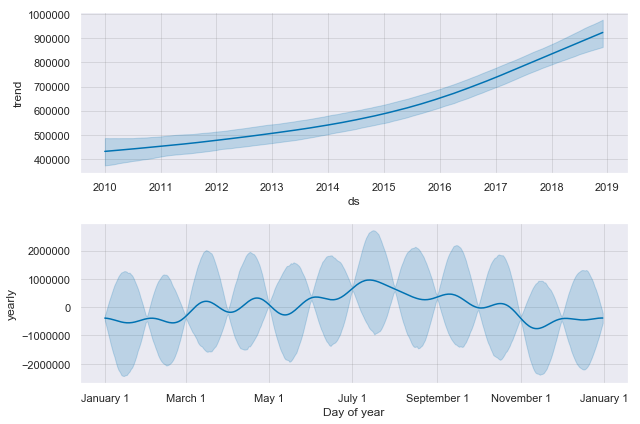

In [26]:
m = pr(mcmc_samples=300) #here is used the Bayesian sampling using prophet
forecast = m.fit(df_croatia).predict()
fig = m.plot_components(forecast)

# All Cities

In [27]:
all_cities_changes = []


for city in cities:
    for i in range(len(df1['Year'].unique())):
        df_city = pd.DataFrame(df1[df1['city'] == city].groupby('Year')['PASSENGERS'].mean())
        city_dict = {}
        try:
            cy = df_city['PASSENGERS'].iloc[i+1]
            py = df_city['PASSENGERS'].iloc[i]
            city_dict['name'] = city
            city_dict['year'] = 2011 + i
            city_dict['percentage_increase'] = ((cy - py) / py) * 100
        except:
            pass
        all_cities_changes.append(city_dict)

# Create a Dataframe for Percentage Changes over the years for all cities

In [164]:
percentage_changes = pd.DataFrame(all_cities_changes)
percentage_changes.dropna(inplace=True)
percentage_changes.head()

,name,year,percentage_increase
0,Atlanta,2011.0,2.923014
1,Atlanta,2012.0,3.469309
2,Atlanta,2013.0,-1.404977
3,Atlanta,2014.0,2.705013
4,Atlanta,2015.0,5.987462


# Visualization of Percentage Changes where percentage change is greater than 10%

In [30]:
px.line(percentage_changes[percentage_changes['percentage_increase'] > 10], x ='year', y='percentage_increase',
       title = 'Percentage Passenger Volume' , color = 'name')


In [31]:
#Visualization for overall percentage change

In [32]:
px.line(percentage_changes, x="year", y="percentage_increase", title='Percentage Passenger volume', color='name')

# Total Percentage Growth of Cities 

In [33]:
total_growth = []

for city in cities:
    city_dict = {}
    last_july = df1[df1['city'] == city]['PASSENGERS'].iloc[-6]
    first_july = df1[df1['city'] == city]['PASSENGERS'].iloc[6]
    city_dict['name'] = city
    city_dict['percentage_growth'] = ((last_july - first_july) / first_july) * 100
    total_growth.append(city_dict)

In [34]:
pd.DataFrame(total_growth).sort_values(by='percentage_growth', ascending=False)

,name,percentage_growth
6,Reykjavik,208.129166
11,Phuket,184.305237
20,Delhi,168.654910
7,Croatia,118.350755
14,Barcelona,103.777090
8,Athens,96.772414
5,Dubai,94.734518
3,Berlin,76.838030
2,Singapore,60.387899
25,Portland,60.347534


# Moving Average
- It is used to forecast time series if Yt depends on the random error terms
- It is used to forecast future values
- It assumes the error terms to be white noise processes with the mean of zero and a constant of varaince

### Note : Do not confuse moving average with Moving Average Smoothing - might go over both later

In [35]:
moving_average = total_monthly.rolling(window=12 , min_periods=3).mean()
moving_average.head()

,PASSENGERS,temperature_mean
ds,,
2010-01-01,NaN,NaN
2010-02-01,NaN,NaN
2010-03-01,76570768.0,445.300
2010-04-01,77608640.5,520.475
2010-05-01,79484452.4,595.140


In [36]:
#View total monthly
total_monthly

,PASSENGERS,temperature_mean
ds,,
2010-01-01,74137239,350.7
2010-02-01,70304808,403.2
2010-03-01,85270257,582.0
2010-04-01,80722258,746.0
2010-05-01,86987700,893.8
...,...,...
2018-08-01,132947597,1154.2
2018-09-01,117926603,1046.3
2018-10-01,122045467,816.2


# Removing Trends from df

### Trend :
- It is a long-term increase or decrease in timeseries data eg stocks
- There are :
            Uptrends
            Downtrends

In [37]:
df_remove_trend = total_monthly - moving_average
df_remove_trend.head()

,PASSENGERS,temperature_mean
ds,,
2010-01-01,NaN,NaN
2010-02-01,NaN,NaN
2010-03-01,8699489.0,136.700
2010-04-01,3113617.5,225.525
2010-05-01,7503247.6,298.660


In [38]:
df_remove_trend.isna().sum()

PASSENGERS          2
temperature_mean    2
dtype: int64

In [39]:
#remove Null values from DataFrame
df_remove_trend.dropna(inplace = True)

In [40]:
#Check results
df_remove_trend

,PASSENGERS,temperature_mean
ds,,
2010-03-01,8.699489e+06,136.700000
2010-04-01,3.113618e+06,225.525000
2010-05-01,7.503248e+06,298.660000
2010-06-01,9.399689e+06,385.050000
2010-07-01,1.444432e+07,407.700000
...,...,...
2018-08-01,1.641842e+07,366.348333
2018-09-01,1.029578e+06,256.531667
2018-10-01,4.802935e+06,30.140000


# Visualize Dataframe after removing Trends

In [41]:
px.line(df_remove_trend.reset_index(),
       x = 'ds',
       y = 'PASSENGERS',
       title = 'Total Average Passengers : Trend Removed Using Moving Average')

# We'll take the difference of one year/12 months from the data because of the annual seasonality observed.

# Differencing:
- It is used to make the series stationary , de-trend and control the autocorrelations
- It is done by subtracting the previous observation from the current observation
- However , over-differenced seies can produce inaccurate estimates


In [42]:
df_diff = df_remove_trend.diff(periods=12)

In [43]:
#Check results
df_diff.head()

,PASSENGERS,temperature_mean
ds,,
2010-03-01,NaN,NaN
2010-04-01,NaN,NaN
2010-05-01,NaN,NaN
2010-06-01,NaN,NaN
2010-07-01,NaN,NaN


In [44]:
df_diff.isna().sum()

PASSENGERS          12
temperature_mean    12
dtype: int64

In [45]:
df_diff.dropna(inplace=True)

In [46]:
df_diff.reset_index(inplace=True)

# Visualation After Differencing

In [47]:
px.line(df_diff, 
        x='ds', 
        y="PASSENGERS", 
        title='Total Average Passengers: Trend Removed using MA + Differencing'
        )

## Decomposition :
- Decomposition separates a timeseries into trend , seasonal effects and remaining variability assumptions
- It eliminates trends and seasonality respectively

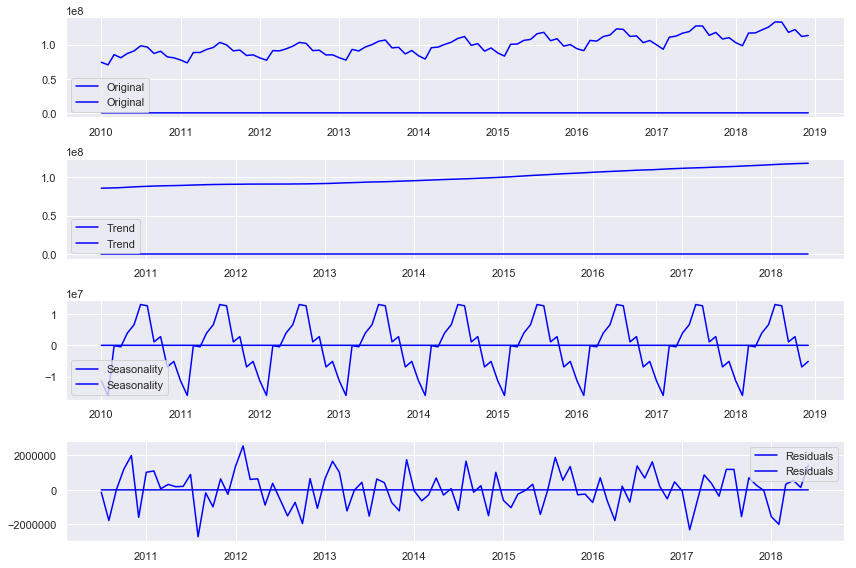

In [48]:
from statsmodels.tsa.seasonal import seasonal_decompose
decomposition = seasonal_decompose(total_monthly)

# Gather the trend, seasonality and noise of decomposed object
trend = decomposition.trend
seasonal = decomposition.seasonal
residual = decomposition.resid

# Plot gathered statistics
plt.figure(figsize=(12,8))
plt.subplot(411)
plt.plot(total_monthly, label='Original', color="blue")
plt.legend(loc='best')
plt.subplot(412)
plt.plot(trend, label='Trend', color="blue")
plt.legend(loc='best')
plt.subplot(413)
plt.plot(seasonal,label='Seasonality', color="blue")
plt.legend(loc='best')
plt.subplot(414)
plt.plot(residual, label='Residuals', color="blue")
plt.legend(loc='best')
plt.tight_layout()

# Now that there timeseries is stationary , let's build models on the time series We wil use statistical modelling methods where there are dependencies in variables/values

# ACF And PACF

In [49]:
total_monthly

,PASSENGERS,temperature_mean
ds,,
2010-01-01,74137239,350.7
2010-02-01,70304808,403.2
2010-03-01,85270257,582.0
2010-04-01,80722258,746.0
2010-05-01,86987700,893.8
...,...,...
2018-08-01,132947597,1154.2
2018-09-01,117926603,1046.3
2018-10-01,122045467,816.2


# Plot ACF - Autocorrelation Function And Partial AutoCorrelation

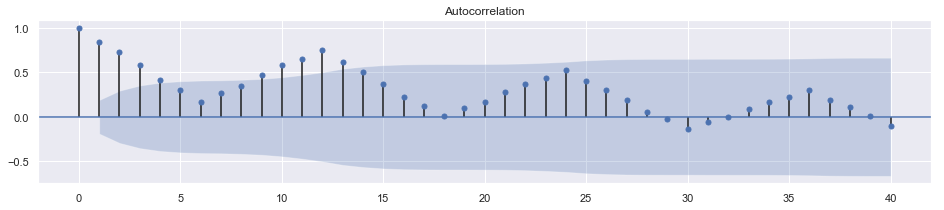

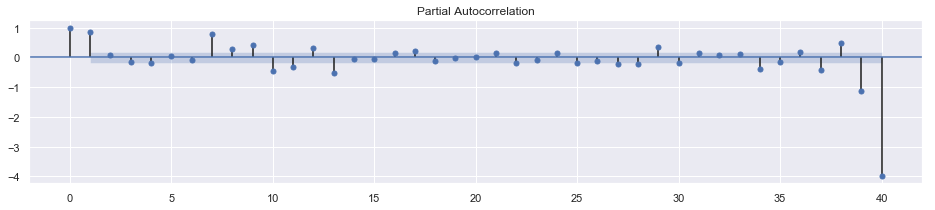

In [50]:
fig , ax = plt.subplots(figsize=(16,3))
plot_acf(total_monthly['PASSENGERS'], ax=ax , lags=40);

fig, ax = plt.subplots(figsize=(16,3))
plot_pacf(total_monthly['PASSENGERS'],ax=ax, lags=40);

# Dickey Fuller Test

In [51]:
#rc
def stationarity_check(df):
    
    """Import adfuller"""
    from statsmodels.tsa.stattools import adfuller
    
    """Calculate rolling statistics"""
    rolmean = df.rolling(window = 8, center = False).mean()
    rolstd = df.rolling(window = 8, center = False).std()
    
    '''Perform the Dickey Fuller Test'''
    dftest = adfuller(df['PASSENGERS']) # change the passengers column as required 
    
    '''Plot rolling statistics:'''
    fig = plt.figure(figsize=(12,6))
    orig = plt.plot(df, color='blue',label='Original')
    mean = plt.plot(rolmean, color='red', label='Rolling Mean')
    std = plt.plot(rolstd, color='black', label = 'Rolling Std')
    plt.legend(loc='best')
    plt.title('Rolling Mean & Standard Deviation')
    plt.show(block=False)
    
    '''Print Dickey-Fuller test results'''
    print ('Results of Dickey-Fuller Test:')

    dfoutput = pd.Series(dftest[0:4], index=['Test Statistic','p-value','#Lags Used','Number of Observations Used'])
    for key,value in dftest[4].items():
        dfoutput['Critical Value (%s)'%key] = value
    print (dfoutput)
    
    return None

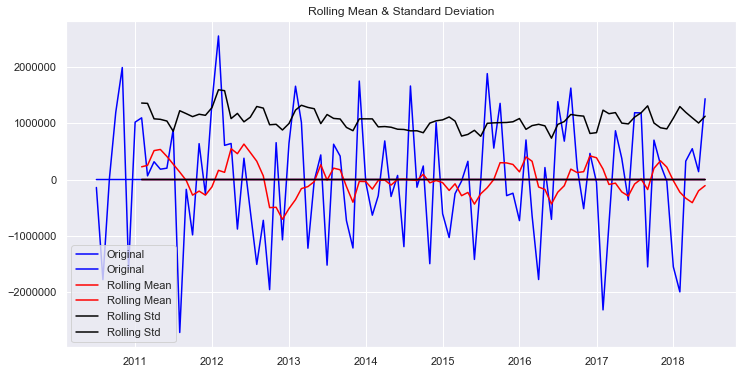

Results of Dickey-Fuller Test:
Test Statistic                 -3.712238
p-value                         0.003944
#Lags Used                     11.000000
Number of Observations Used    84.000000
Critical Value (1%)            -3.510712
Critical Value (5%)            -2.896616
Critical Value (10%)           -2.585482
dtype: float64


In [52]:
df_log_decompose = residual
df_log_decompose.dropna(inplace=True)

# Check stationarity
stationarity_check(df_log_decompose)

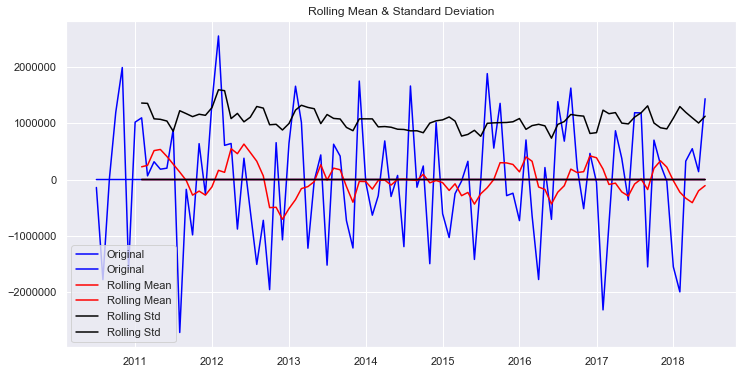

Results of Dickey-Fuller Test:
Test Statistic                 -3.712238
p-value                         0.003944
#Lags Used                     11.000000
Number of Observations Used    84.000000
Critical Value (1%)            -3.510712
Critical Value (5%)            -2.896616
Critical Value (10%)           -2.585482
dtype: float64


In [53]:
df_log_decompose = residual
df_log_decompose.dropna(inplace=True)

#Check stationarity
stationarity_check(df_log_decompose)

# Observations : 

The Dickey-Fuller test, tests the null hypothesis that the data is not stationary. Therefore, a low p-value <0.01 means we can reject the null hypothesis and be very confident that our data is stationary.
Decision is to reject the null hypothesis $H_{0}$ 

# ARMA Model - Autoregressive and Moving Average Model

### Autoregressive model : explains the mean and momentum reversion effects observed in trading markets

### Moving Average part : captures the shock effects observed in the white noise terms

## ARMA : Forecast based on both the past and error terms

### Note : It is referred to as ARMA(p,q) where p is autoregressive terms and q is moving average.

In [54]:
# Fit an AR(1) model to the first simulated data
mod_arma = ARMA(total_monthly['PASSENGERS'], order=(1,6))
res_arma = mod_arma.fit()

# Print out summary information on the fit
print(res_arma.summary())

# Print out the estimate for the constant and for theta
print(res_arma.params)

                              ARMA Model Results                              
Dep. Variable:             PASSENGERS   No. Observations:                  108
Model:                     ARMA(1, 6)   Log Likelihood               -1824.128
Method:                       css-mle   S.D. of innovations        4984154.139
Date:                Sat, 29 Feb 2020   AIC                           3666.255
Time:                        20:38:42   BIC                           3690.394
Sample:                    01-01-2010   HQIC                          3676.043
                         - 12-01-2018                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
const             9.972e+07   1.06e+07      9.404      0.000    7.89e+07    1.21e+08
ar.L1.PASSENGERS     0.9894      0.015     64.882      0.000       0.960       1.019
ma.L1.PASSENGERS    -0.3593 

In [55]:
pd.plotting.register_matplotlib_converters()

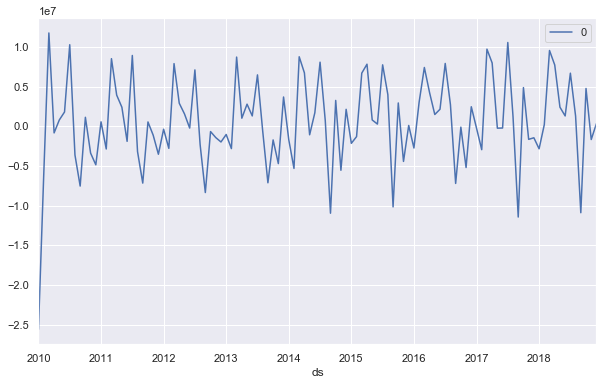

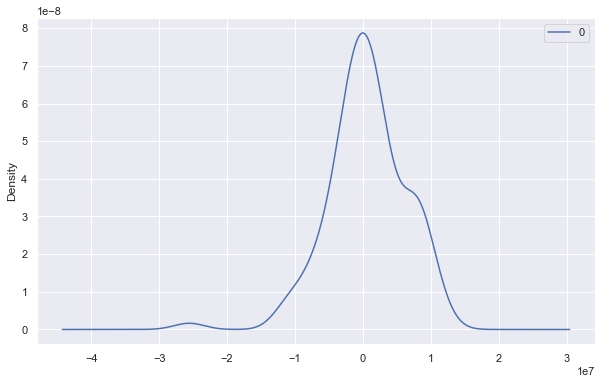

                  0
count  1.080000e+02
mean   5.197447e+05
std    5.697081e+06
min   -2.558265e+07
25%   -2.409794e+06
50%    4.389434e+05
75%    3.742452e+06
max    1.174403e+07


In [56]:
residuals = pd.DataFrame(res_arma.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
print(residuals.describe())

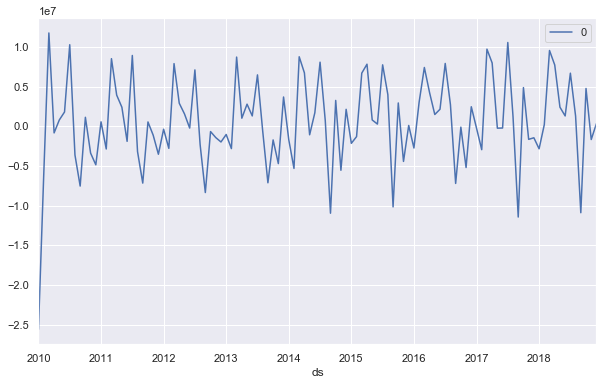

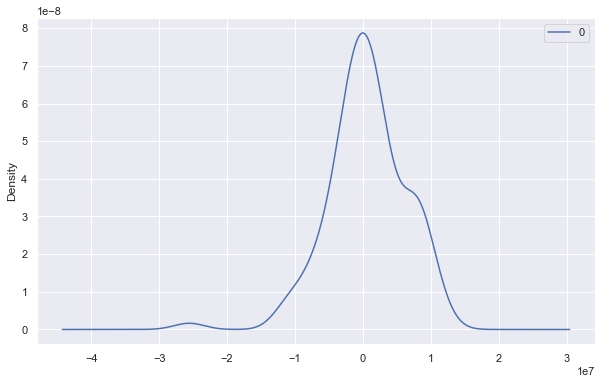

                  0
count  1.080000e+02
mean   5.197447e+05
std    5.697081e+06
min   -2.558265e+07
25%   -2.409794e+06
50%    4.389434e+05
75%    3.742452e+06
max    1.174403e+07


In [57]:
#plotting residuals of ARMA models
residuals = pd.DataFrame(res_arma.resid)
residuals.plot()
plt.show()
residuals.plot(kind='kde')
plt.show()
print(residuals.describe())

## SARIMA on Average Passengers Across all Destinations

In [58]:
total_monthly

,PASSENGERS,temperature_mean
ds,,
2010-01-01,74137239,350.7
2010-02-01,70304808,403.2
2010-03-01,85270257,582.0
2010-04-01,80722258,746.0
2010-05-01,86987700,893.8
...,...,...
2018-08-01,132947597,1154.2
2018-09-01,117926603,1046.3
2018-10-01,122045467,816.2


In [59]:
size = int(len(total_monthly) * 0.7)
train , test = total_monthly['PASSENGERS'][0:size], total_monthly['PASSENGERS'][size:len(total_monthly)]

In [60]:
from statsmodels.tsa.statespace.sarimax import SARIMAX

train.index = pd.DatetimeIndex(train.index.values,
                              freq=train.index.inferred_freq)

model = SARIMAX(train,order=(0, 1 ,0), seasonal_order=(0,1,0,12))
results = model.fit()

In [61]:
results.summary()

<class 'statsmodels.iolib.summary.Summary'>
"""
                                 Statespace Model Results                                 
==========================================================================================
Dep. Variable:                         PASSENGERS   No. Observations:                   75
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -979.586
Date:                            Sat, 29 Feb 2020   AIC                           1961.171
Time:                                    20:38:44   BIC                           1963.298
Sample:                                01-01-2010   HQIC                          1962.006
                                     - 03-01-2016                                         
Covariance Type:                              opg                                         
==============================================================================
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      2.512e+12   3.52e+11      7.136      0.000    1.82e+12     3.2e+12
===================================================================================
Ljung-Box (Q):                       56.88   Jarque-Bera (JB):                 3.57
Prob(Q):                              0.04   Prob(JB):                         0.17
Heteroskedasticity (H):               0.62   Skew:                             0.58
Prob(H) (two-sided):                  0.29   Kurtosis:                         3.16
===================================================================================

Warnings:
[1] Covariance matrix calculated using the outer product of gradients (complex-step).
"""

In [62]:
start=len(train)
end=len(train)+len(test)-1

predictions = results.predict(start=start, end=end , dynamic=False, typ='levels')

In [63]:
total_monthly['PASSENGERS']

ds
2010-01-01     74137239
2010-02-01     70304808
2010-03-01     85270257
2010-04-01     80722258
2010-05-01     86987700
                ...    
2018-08-01    132947597
2018-09-01    117926603
2018-10-01    122045467
2018-11-01    111852372
2018-12-01    113404454
Name: PASSENGERS, Length: 108, dtype: int64

In [64]:
pd.plotting.register_matplotlib_converters()

# Plot predictions against known values

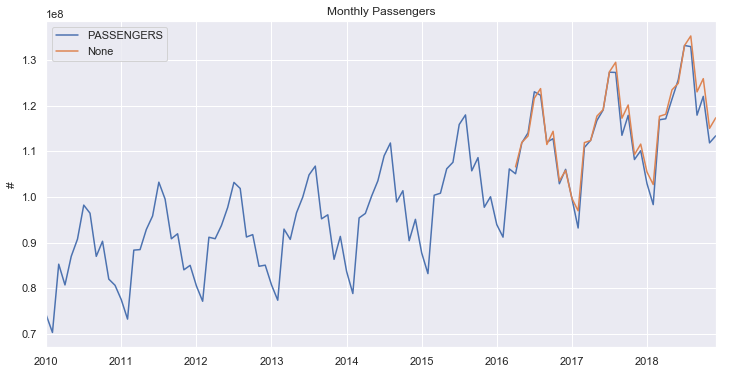

In [65]:
title = 'Monthly Passengers'
ylabel='#'
xlabel=''

ax = total_monthly['PASSENGERS'].plot(legend=True,figsize=(12,6),title=title)
predictions.plot(legend=True)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel, ylabel=ylabel);

In [66]:
actual = total_monthly['PASSENGERS'][start:end+1]

In [68]:
from sklearn.metrics import mean_squared_error
from math import sqrt

rms = sqrt(mean_squared_error(actual , predictions))
rms

2189418.759736979

# SARIMA Model for Iceland - Actual Vs Predictions

In [83]:
def fit_predict_sarima(df1, city):
    df1 = df1[df1['city'] == city]
    df1 = df1.rename(columns={'PASSENGERS': 'y'}).set_index('ds')
    
    size = int(len(df1) * 0.7)
    train, test = df1['y'][0:size], df1['y'][size:len(df1)]
    
    model = SARIMAX(train,order=(0, 1, 0),seasonal_order=(0,1,0,12))
    results = model.fit()
    
    print(results.summary())
    
    start=len(train)
    end=len(train)+len(test)-1

    predictions = results.predict(start=start, end=end, dynamic=False, typ='levels')
    predictions = pd.DataFrame(predictions).reset_index().rename(columns={'index': 'ds', 0: 'y'})
    # Plot predictions against known values
#     print(predictions)

    fig = go.Figure()

    fig.add_trace(go.Scatter(x=df1.reset_index()['ds'], 
                             y=df1['y'], 
                             mode='lines',
                             name='Actual',
                             line_color = 'rgb(0, 48, 143)'))

    fig.add_trace(go.Scatter(x=predictions['ds'], 
                             y=predictions['y'], 
                             mode='lines',
                             name='Predictions',
                             line_color = 'rgb(200,0,100)'))
    
#     future_predictions = results.get_forecast(steps=36)
#     future_predictions = pd.DataFrame(future_predictions).reset_index().rename(columns={'index': 'ds', 0: 'y'})
    
#     fig.add_trace(go.Scatter(x=future_predictions['ds'], 
#                              y=future_predictions['y'], 
#                              mode='lines',
#                              name='Actual',
#                              line_color = 'rgb(0, 48, 143)'))
    
    rms = sqrt(mean_squared_error(test, predictions['y']))
    print(rms)
    
    return fig

In [81]:
fit_predict_sarima(df1, 'Reykjavik')

                                 Statespace Model Results                                 
Dep. Variable:                                  y   No. Observations:                   75
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood                -628.167
Date:                            Sat, 29 Feb 2020   AIC                           1258.335
Time:                                    21:01:20   BIC                           1260.462
Sample:                                01-01-2010   HQIC                          1259.170
                                     - 03-01-2016                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      3.581e+07   4.59e+06      7.796      0.000    2.68e+07    4.48e+07
Ljung-Box (Q):                     

# Future Sarima Model Prediction 

In [86]:
def fit_predict_sarima_future(df1, city):
    df1 = df1[df1['city'] == city]
    df1 = df1.rename(columns={'PASSENGERS': 'y'}).set_index('ds')
    
    model = SARIMAX(df1['y'],order=(0, 1, 0),seasonal_order=(0,1,0,12))
    results = model.fit()
    
    print(results.summary())

    predictions = results.get_forecast(steps=36)
    
    pred_for = predictions.predicted_mean
    spred = pred_for.to_frame()
    
#     predictions = results.predict(dynamic=False, typ='levels')
#     predictions = pd.DataFrame(predictions).reset_index().rename(columns={'index': 'ds', 0: 'y'})
    # Plot predictions against known values

    fig = go.Figure()

    fig.add_trace(go.Scatter(x=df1.reset_index()['ds'], 
                             y=df1['y'], 
                             mode='lines',
                             name='Actual',
                             line_color = 'rgb(0, 48, 143)'))

    fig.add_trace(go.Scatter(x=spred.index, 
                             y=spred[0], 
                             mode='lines',
                             name='Predictions',
                             line_color = 'rgb(200,0,100)'))
    
    fig.update_layout(title = 'Future Predictions for Reykjavik', xaxis_title='Year',
                  yaxis_title='Number of Passengers')
    
#     fig.write_image('future_image.jpeg', scale=2)
    
    return fig

In [87]:
fit_predict_sarima_future(df1, 'Reykjavik')

                                 Statespace Model Results                                 
Dep. Variable:                                  y   No. Observations:                  108
Model:             SARIMAX(0, 1, 0)x(0, 1, 0, 12)   Log Likelihood               -1036.851
Date:                            Sat, 29 Feb 2020   AIC                           2075.701
Time:                                    21:11:03   BIC                           2078.255
Sample:                                01-01-2010   HQIC                          2076.733
                                     - 12-01-2018                                         
Covariance Type:                              opg                                         
                 coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------
sigma2      1.542e+08   9.11e+06     16.933      0.000    1.36e+08    1.72e+08
Ljung-Box (Q):                     

In [89]:
def fit_predict_model(dataframe, interval_width = 0.95, changepoint_range = 0.8):
    m = pr(daily_seasonality = False , yearly_seasonality = True ,weekly_seasonality = False ,
          seasonality_mode = 'multiplicative',
          mcmc_samples=1000,
          interval_width = interval_width,
          changepoint_range = changepoint_range)
    m = m.fit(dataframe)
    forecast = m.predict(dataframe)
    forecast['fact'] = dataframe['y'].reset_index(drop = True)
    return forecast

pred = fit_predict_model(df_croatia)

In [90]:
pred.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yearly,yearly_lower,yearly_upper,additive_terms,additive_terms_lower,additive_terms_upper,yhat,fact
0,2010-01-01,403275.393413,78631.634516,184086.418782,377090.144349,430624.020439,-0.672076,-0.702644,-0.641304,-0.672076,-0.702644,-0.641304,0.0,0.0,0.0,132243.623166,165000
1,2010-02-01,406256.721081,69166.895811,177933.745551,382436.268989,430482.442459,-0.700142,-0.730660,-0.670864,-0.700142,-0.730660,-0.670864,0.0,0.0,0.0,121819.166031,145000
2,2010-03-01,408949.533168,113560.920600,222895.595075,387082.136253,430733.030900,-0.591005,-0.622077,-0.558872,-0.591005,-0.622077,-0.558872,0.0,0.0,0.0,167258.427525,199000
3,2010-04-01,411930.860836,239169.420389,349707.545953,393107.836516,431521.194963,-0.283903,-0.318212,-0.252050,-0.283903,-0.318212,-0.252050,0.0,0.0,0.0,294982.441785,267000
4,2010-05-01,414907.036442,434031.889737,548488.031397,398095.228657,432491.372120,0.177629,0.141255,0.213249,0.177629,0.141255,0.213249,0.0,0.0,0.0,488606.668609,492000


# Detect Anomalies

In [91]:
def detect_anomalies(forecast):
    forecasted = forecast[['ds','trend','yhat','yhat_lower','yhat_upper','fact']].copy()
    
    forecasted['anomaly'] = 0
    forecasted.loc[forecasted['fact'] > forecasted['yhat_upper'], 'anomaly'] = 1
    forecasted.loc[forecasted['fact'] < forecasted['yhat_lower'], 'anomaly'] = -1
    
    """Anomaly importance"""
    forecasted['importance'] = 0
    forecasted.loc[forecasted['anomaly'] == 1, 'importance'] = \
          (forecasted['fact'] - forecasted['yhat_upper'])/forecasted['fact']
    forecasted.loc[forecasted['anomaly'] ==-1, 'importance'] = \
          (forecasted['yhat_lower'] - forecasted['fact'])/forecasted['fact']
    
    return forecasted

pred = detect_anomalies(pred)

In [92]:
pred.head()

,ds,trend,yhat,yhat_lower,yhat_upper,fact,anomaly,importance
0,2010-01-01,403275.393413,132243.623166,78631.634516,184086.418782,165000,0,0.0
1,2010-02-01,406256.721081,121819.166031,69166.895811,177933.745551,145000,0,0.0
2,2010-03-01,408949.533168,167258.427525,113560.920600,222895.595075,199000,0,0.0
3,2010-04-01,411930.860836,294982.441785,239169.420389,349707.545953,267000,0,0.0
4,2010-05-01,414907.036442,488606.668609,434031.889737,548488.031397,492000,0,0.0


### Subset Dataframe for Where there are Anomalies

In [93]:
pred[pred['anomaly'] == 1]

,ds,trend,yhat,yhat_lower,yhat_upper,fact,anomaly,importance
90,2017-07-01,796742.365001,1.684130e+06,1.624630e+06,1.745705e+06,1750000,1,0.002454


In [94]:
fig = go.Figure()
    
fig.add_trace(go.Scatter(
    x=pred['ds'], y=pred['fact'],
    line_color='rgb(0,100,80)',
    name='Actual'))

fig.add_trace(go.Scatter(
    x=pred['ds'],
    y=pred['yhat_upper'],
    fill="tonexty",
    fillcolor='rgba(0,100,80,0.2)',
    line_color='rgba(255,255,255,0)',
    showlegend=False,
    name='Predicted Upper'))

fig.add_trace(go.Scatter(
    x=pred['ds'],
    y=pred['yhat_lower'],
    fill="tonexty",
    fillcolor='rgba(0,100,80,0.2)',
    line_color='rgba(255,255,255,0)',
    showlegend=False,
    name='Predicted Lower'))

size=[]
[size.append(20) for i in range(len(pred[pred['anomaly'] != 0]))]
color = []
[color.append(1) for i in range(len(pred[pred['anomaly'] != 0]))]

fig.add_trace(go.Scatter(x=pred[pred['anomaly'] != 0]['ds'],
                         y=pred[pred['anomaly'] != 0]['fact'], 
                         name="Anomaly", 
                         mode='markers',
                         marker=dict(size=size,
                                    color=color)))

fig.update_layout(title='Croatia Passenger Volume',
                  yaxis_zeroline=False, xaxis_zeroline=False)

fig.show() 

In [95]:
#use for visualization function
def plot_anomalities(df1 , ds):
    fig = go.Figure()
    
    fig.add_trace(go.Scatter(
    x=pred['ds'], y=pred['fact'],
    line_color='rgb(0,100,80)',
    name='Actual'))

    fig.add_trace(go.Scatter(
    x=pred['ds'],
    y=pred['yhat_upper'],
    fill="tonexty",
    fillcolor='rgba(0,100,80,0.2)',
    line_color='rgba(255,255,255,0)',
    showlegend=False,
    name='Predicted Upper'))

    fig.add_trace(go.Scatter(
    x=pred['ds'],
    y=pred['yhat_lower'],
    fill="tonexty",
    fillcolor='rgba(0,100,80,0.2)',
    line_color='rgba(255,255,255,0)',
    showlegend=False,
    name='Predicted Lower'))

    size=[]
    [size.append(20) for i in range(len(pred[pred['anomaly'] != 0]))]
    color = []
    [color.append(1) for i in range(len(pred[pred['anomaly'] != 0]))]

    fig.add_trace(go.Scatter(x=pred[pred['anomaly'] != 0]['ds'],
                         y=pred[pred['anomaly'] != 0]['fact'], 
                         name="Anomaly", 
                         mode='markers',
                         marker=dict(size=size,
                                    color=color)))

    fig.update_layout(title='Croatia Passenger Volume',
                  yaxis_zeroline=False, xaxis_zeroline=False)

    fig.show() 

In [97]:
plot_anomalities(df1 , 'ds')

These uncertainty intervals assume that the future will see the same frequency and magnitude of rate changes as the past. By default Prophet will only return uncertainty in the trend and observation noise.

# Graph Anomalies for Iceland

In [102]:
def graph_anomalies2(city, df1):
    df1 = df1[df1['city'] == city]
    df1 = df1.rename(columns={'PASSENGERS': 'y'})
    df1.head()
    
    m = pr(daily_seasonality = False, yearly_seasonality = True, weekly_seasonality = False,
                seasonality_mode = 'multiplicative', 
                interval_width = 0.90,
                changepoint_range = 0.8)
    m = m.fit(df1)
    forecast = m.predict(df1)
    forecast['fact'] = df1['y'].reset_index(drop = True)
    
    forecasted = forecast[['ds','trend', 'yhat', 'yhat_lower', 'yhat_upper', 'fact']].copy()
    #forecast['fact'] = df['y']

    forecasted['anomaly'] = 0
    forecasted.loc[forecasted['fact'] > forecasted['yhat_upper'], 'anomaly'] = 1
    forecasted.loc[forecasted['fact'] < forecasted['yhat_lower'], 'anomaly'] = -1

    #anomaly importances
    forecasted['importance'] = 0
    forecasted.loc[forecasted['anomaly'] ==1, 'importance'] = \
        (forecasted['fact'] - forecasted['yhat_upper'])/forecasted['fact']
    forecasted.loc[forecasted['anomaly'] ==-1, 'importance'] = \
        (forecasted['yhat_lower'] - forecasted['fact'])/forecasted['fact']
    
    fig = go.Figure()
    
    fig.add_trace(go.Scatter(
        x=forecasted['ds'], y=forecasted['fact'],
        line_color='rgb(0,100,80)',
        name='Actual'))

    fig.add_trace(go.Scatter(
        x=forecasted['ds'],
        y=forecasted['yhat_upper'],
        fill="tonexty",
        fillcolor='rgba(0,100,80,0.2)',
        line_color='rgba(255,255,255,0)',
        showlegend=False,
        name='Predicted Upper'))

    fig.add_trace(go.Scatter(
        x=forecasted['ds'],
        y=forecasted['yhat_lower'],
        fill="tonexty",
        fillcolor='rgba(0,100,80,0.2)',
        line_color='rgba(255,255,255,0)',
        showlegend=False,
        name='Predicted Lower'))

    size=[]
    [size.append(20) for i in range(len(forecasted[forecasted['anomaly'] != 0]))]
    color = []
    [color.append(1) for i in range(len(forecasted[forecasted['anomaly'] != 0]))]

    fig.add_trace(go.Scatter(x=forecasted[forecasted['anomaly'] != 0]['ds'],
                             y=forecasted[forecasted['anomaly'] != 0]['fact'], 
                             name="Anomaly", 
                             mode='markers',
                             marker=dict(size=size,
                                        color=color)))

    fig.update_layout(title=f'{city} Passenger Volume',
                      yaxis_zeroline=False, xaxis_zeroline=False)

    fig.show() 
    
    rmse = sqrt(mean_squared_error(forecasted['fact'], forecasted['yhat']))
    print(rmse)
    
    fig.write_image('iceland_anomalies.jpeg', scale=2)

In [103]:
graph_anomalies2('Reykjavik', df1)

11189.365252207577


# Iceland Sarima Exogenoeus

In [106]:
def fit_predict_sarimax_exog(df1, city):
    df1 = df1[df1['city'] == city]
    df1 = df1.rename(columns={'PASSENGERS': 'y'}).set_index('ds')
    
    size = int(len(df1) * 0.7)
    train, test = df1['y'][0:size], df1['y'][size:len(df1)]
    train_exog, test_exog = df1[0:size], df1[size:len(df1)]
    
    endog = train_exog['y']
    exog = train_exog[['temperature_mean']]

    # Fit the model
    mod = sm.tsa.statespace.SARIMAX(endog, exog, order=(1,0,0,0,1))
    res = mod.fit(disp=False)
    print(res.summary())
    
    start=len(train)
    end=len(train)+len(test)-1

    exog_forecast = test_exog[['temperature_mean']]

    predictions = res.predict(start=start, end=end, exog=exog_forecast, dynamic=False, typ='levels')
    predictions = pd.DataFrame(predictions).reset_index().rename(columns={'index': 'ds', 0: 'y'})
#     predictions = results.predict(start=start, end=end, dynamic=False, typ='levels')
#     predictions = pd.DataFrame(predictions).reset_index().rename(columns={'index': 'ds', 0: 'y'})
    # Plot predictions against known values

    fig = go.Figure()

    fig.add_trace(go.Scatter(x=df1.reset_index()['ds'], 
                             y=df1['y'], 
                             mode='lines',
                             name='Actual',
                             line_color = 'rgb(0, 48, 143)'))

    fig.add_trace(go.Scatter(x=predictions['ds'], 
                             y=predictions['y'], 
                             mode='lines',
                             name='Predictions',
                             line_color = 'rgb(200,0,100)'))
    
    rms = sqrt(mean_squared_error(test, predictions['y']))
    print(rms)
    
    return fig

In [107]:
fit_predict_sarimax_exog(df1, 'Reykjavik')

                           Statespace Model Results                           
Dep. Variable:                      y   No. Observations:                   75
Model:               SARIMAX(1, 0, 0)   Log Likelihood                -845.949
Date:                Sun, 01 Mar 2020   AIC                           1697.899
Time:                        17:48:37   BIC                           1704.851
Sample:                    01-01-2010   HQIC                          1700.675
                         - 03-01-2016                                         
Covariance Type:                  opg                                         
                       coef    std err          z      P>|z|      [0.025      0.975]
------------------------------------------------------------------------------------
temperature_mean  6003.7784    761.038      7.889      0.000    4512.171    7495.386
ar.L1                0.9748      0.022     43.361      0.000       0.931       1.019
sigma2            3.526e+08 

# Sarimax On Monthly Totals

In [111]:
total_monthly = pd.DataFrame(df1.groupby('ds')['PASSENGERS', 'temperature_mean','precipitation','cost_of_living_index'].sum())

In [112]:
size = int(len(total_monthly) * 0.7)
train_exog, test_exog = total_monthly[0:size], total_monthly[size:len(total_monthly)]

In [113]:
train_exog

,PASSENGERS,temperature_mean,precipitation,cost_of_living_index
ds,,,,
2010-01-01,74137239,350.7,2908.000000,4101.99
2010-02-01,70304808,403.2,3215.000000,4101.99
2010-03-01,85270257,582.0,4084.000000,4101.99
2010-04-01,80722258,746.0,3096.000000,4101.99
2010-05-01,86987700,893.8,3279.500000,4101.99
...,...,...,...,...
2015-11-01,97742135,654.4,4062.000000,3695.88
2015-12-01,100052561,555.2,4452.000000,3695.88
2016-01-01,93947954,400.6,3379.000000,3531.68


In [115]:
# Variables
endog = train_exog['PASSENGERS']
exog = train_exog[['temperature_mean','precipitation','cost_of_living_index']]

#Fit the model
mod = sm.tsa.statespace.SARIMAX(endog , exog, order=(1,0,0,0,1))
res = mod.fit(disp=False)
print(res.summary())

                           Statespace Model Results                           
Dep. Variable:             PASSENGERS   No. Observations:                   75
Model:               SARIMAX(1, 0, 0)   Log Likelihood               -1277.654
Date:                Sun, 01 Mar 2020   AIC                           2565.309
Time:                        18:00:19   BIC                           2576.896
Sample:                    01-01-2010   HQIC                          2569.936
                         - 03-01-2016                                         
Covariance Type:                  opg                                         
                           coef    std err          z      P>|z|      [0.025      0.975]
----------------------------------------------------------------------------------------
temperature_mean      2.233e+04   6189.683      3.608      0.000    1.02e+04    3.45e+04
precipitation         3977.9768   1114.594      3.569      0.000    1793.413    6162.541
cost_of_livi

In [122]:
start = len(train_exog)
end=len(train_exog)+len(test_exog)-1

exog_forecast = test_exog[['temperature_mean','precipitation','cost_of_living_index']]

predictions = res.predict(start=start, end=end, exog=exog_forecast, dynamic=False , 
                          type='levels').rename('SARIMA(0,1,0)(0,1,0,12)Predictions')

In [123]:
predictions

2016-04-01    1.030816e+08
2016-05-01    1.082204e+08
2016-06-01    1.082959e+08
2016-07-01    1.055536e+08
2016-08-01    1.076601e+08
2016-09-01    1.004277e+08
2016-10-01    9.505503e+07
2016-11-01    8.628828e+07
2016-12-01    7.917391e+07
2017-01-01    8.334161e+07
2017-02-01    8.088482e+07
2017-03-01    8.370930e+07
2017-04-01    8.905857e+07
2017-05-01    9.081457e+07
2017-06-01    9.638966e+07
2017-07-01    9.865062e+07
2017-08-01    1.014856e+08
2017-09-01    9.352207e+07
2017-10-01    9.182508e+07
2017-11-01    7.937277e+07
2017-12-01    7.529108e+07
2018-01-01    7.797523e+07
2018-02-01    8.031057e+07
2018-03-01    8.184112e+07
2018-04-01    8.567148e+07
2018-05-01    9.494068e+07
2018-06-01    9.657226e+07
2018-07-01    9.895335e+07
2018-08-01    9.918454e+07
2018-09-01    9.769363e+07
2018-10-01    9.088767e+07
2018-11-01    8.539391e+07
2018-12-01    8.270243e+07
Freq: MS, Name: SARIMA(0,1,0)(0,1,0,12)Predictions, dtype: float64

# Plot Predictions Against Known Values

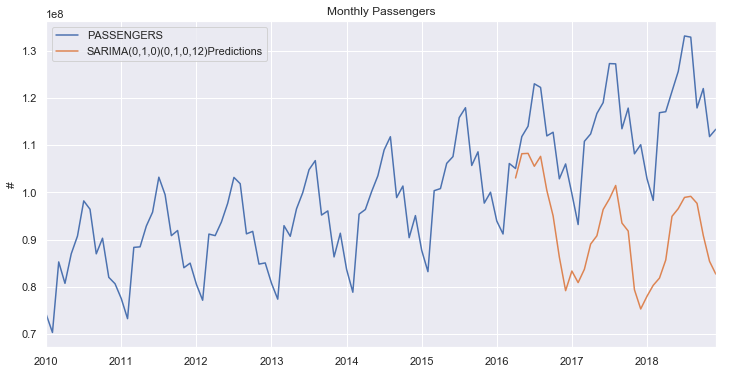

In [125]:
title = 'Monthly Passengers'
ylabel='#'
xlabel=''

ax = total_monthly['PASSENGERS'].plot(legend=True,figsize=(12,6),title=title)
predictions.plot(legend=True)
ax.autoscale(axis='x',tight=True)
ax.set(xlabel=xlabel , ylabel=ylabel);

In [126]:
from sklearn.metrics import mean_squared_error
from math import sqrt

In [127]:
rms = sqrt(mean_squared_error(actual, predictions))
rms

24354409.298317544

# Prophet

In [128]:
prophetdf = pd.DataFrame(df1[['PASSENGERS','ds']])
prophetdf

,PASSENGERS,ds
0,2735491,2010-01-01
1,1929494,2010-01-01
2,1681005,2010-01-01
3,489487,2010-01-01
4,4154249,2010-01-01
...,...,...
4963,3794306,2018-12-01
4964,1295947,2018-12-01
4965,3491734,2018-12-01
4966,3491734,2018-12-01


In [130]:
prophetdf = prophetdf.rename(columns = {'PASSENGERS':'y'})
prophetdf

,y,ds
0,2735491,2010-01-01
1,1929494,2010-01-01
2,1681005,2010-01-01
3,489487,2010-01-01
4,4154249,2010-01-01
...,...,...
4963,3794306,2018-12-01
4964,1295947,2018-12-01
4965,3491734,2018-12-01
4966,3491734,2018-12-01


In [131]:
Model = pr(interval_width = 0.95)

In [132]:
Model.fit(prophetdf)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


# # USe make_future_dataframe with a monthly frequency and periods = 36 for 3 years


In [133]:
future_dates = Model.make_future_dataframe(periods=36, freq='MS')

In [134]:
forecast = Model.predict(future_dates)
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2010-01-01,1.830412e+06,-1.372640e+06,4.593640e+06,1.830412e+06,1.830412e+06,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,0.0,0.0,0.0,1.579659e+06
1,2010-01-01,1.830412e+06,-1.275672e+06,4.898025e+06,1.830412e+06,1.830412e+06,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,0.0,0.0,0.0,1.579659e+06
2,2010-01-01,1.830412e+06,-1.429940e+06,4.816559e+06,1.830412e+06,1.830412e+06,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,0.0,0.0,0.0,1.579659e+06
3,2010-01-01,1.830412e+06,-1.517310e+06,4.595714e+06,1.830412e+06,1.830412e+06,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,0.0,0.0,0.0,1.579659e+06
4,2010-01-01,1.830412e+06,-1.210382e+06,4.495919e+06,1.830412e+06,1.830412e+06,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,0.0,0.0,0.0,1.579659e+06


# Visualisation of Model Forecast

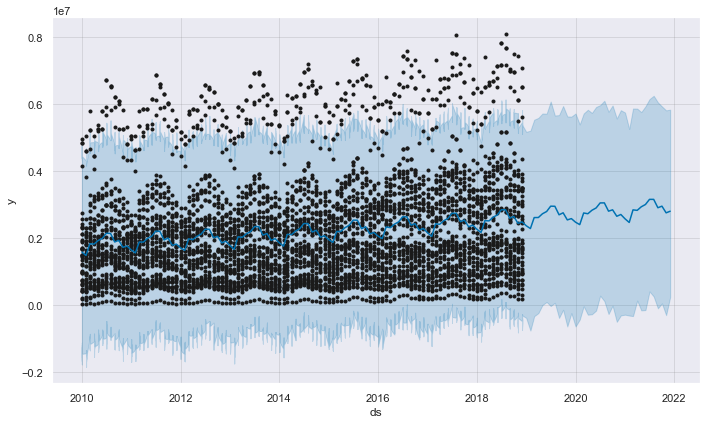

In [135]:
Model.plot(forecast , uncertainty=True)
plt.show()

# Create a new DataFrame for Total Monthly for Prophet

In [138]:
total_monthly_prophet = total_monthly[['PASSENGERS']]
total_monthly_prophet = total_monthly_prophet.rename(columns={'PASSENGERS':'y'})
total_monthly_prophet.head()


,y
ds,
2010-01-01,74137239
2010-02-01,70304808
2010-03-01,85270257
2010-04-01,80722258
2010-05-01,86987700


In [139]:
size = int(len(total_monthly_prophet) * 0.7)
train, test = pd.DataFrame(total_monthly_prophet['y'][0:size]), pd.DataFrame(total_monthly_prophet['y'][size:len(total_monthly_prophet)])

In [140]:
train.head()

,y
ds,
2010-01-01,74137239
2010-02-01,70304808
2010-03-01,85270257
2010-04-01,80722258
2010-05-01,86987700


In [142]:
train.reset_index(inplace=True)
test.reset_index(inplace=True)

In [143]:
start = len(train)
end=len(train)+len(test)-1

In [144]:
future_dates.head()

,ds
0,2010-01-01
1,2010-01-01
2,2010-01-01
3,2010-01-01
4,2010-01-01


In [145]:
train.head()

,ds,y
0,2010-01-01,74137239
1,2010-02-01,70304808
2,2010-03-01,85270257
3,2010-04-01,80722258
4,2010-05-01,86987700


In [ ]:
Model = proph(interval_width=0.95)
Model.fit(train)
forecast = Model.predict(pd.DataFrame(total_monthly_prophet.reset_index()['ds'][start:end]))
forecast.head()
Model.plot(forecast, uncertainty=True)
plt.show()

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


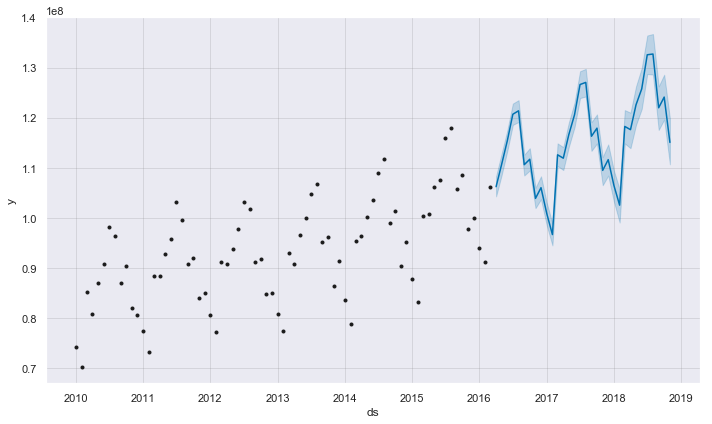

In [147]:
Model = pr(interval_width=0.95)
Model.fit(train)
forecast = Model.predict(pd.DataFrame(total_monthly_prophet.reset_index()['ds'][start:end]))
forecast.head()
Model.plot(forecast , uncertainty=True)
plt.show()

In [148]:
# Check forecast DF
forecast.head()

,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2016-04-01,1.070467e+08,1.042913e+08,1.083051e+08,1.070213e+08,1.070719e+08,-8.270554e+05,-8.270554e+05,-8.270554e+05,-8.270554e+05,-8.270554e+05,-8.270554e+05,0.0,0.0,0.0,1.062196e+08
1,2016-05-01,1.075169e+08,1.085198e+08,1.128147e+08,1.074407e+08,1.075936e+08,3.140095e+06,3.140095e+06,3.140095e+06,3.140095e+06,3.140095e+06,3.140095e+06,0.0,0.0,0.0,1.106570e+08
2,2016-06-01,1.080028e+08,1.133655e+08,1.174702e+08,1.078755e+08,1.081542e+08,7.389188e+06,7.389188e+06,7.389188e+06,7.389188e+06,7.389188e+06,7.389188e+06,0.0,0.0,0.0,1.153920e+08
3,2016-07-01,1.084730e+08,1.185572e+08,1.228089e+08,1.082772e+08,1.086945e+08,1.220982e+07,1.220982e+07,1.220982e+07,1.220982e+07,1.220982e+07,1.220982e+07,0.0,0.0,0.0,1.206828e+08
4,2016-08-01,1.089588e+08,1.191329e+08,1.234892e+08,1.086859e+08,1.092535e+08,1.240431e+07,1.240431e+07,1.240431e+07,1.240431e+07,1.240431e+07,1.240431e+07,0.0,0.0,0.0,1.213631e+08


In [149]:
df_actual = total_monthly_prophet['y'][start:end]
df_actual

ds
2016-04-01    105083597
2016-05-01    111848720
2016-06-01    114057345
2016-07-01    123055293
2016-08-01    122280838
2016-09-01    111996399
2016-10-01    112776728
2016-11-01    102895217
2016-12-01    106051438
2017-01-01     99739177
2017-02-01     93197978
2017-03-01    110845172
2017-04-01    112418698
2017-05-01    116753166
2017-06-01    119065618
2017-07-01    127339015
2017-08-01    127284734
2017-09-01    113512437
2017-10-01    117899383
2017-11-01    108198669
2017-12-01    110136074
2018-01-01    102951591
2018-02-01     98322581
2018-03-01    116923555
2018-04-01    117133239
2018-05-01    121440198
2018-06-01    125687199
2018-07-01    133197613
2018-08-01    132947597
2018-09-01    117926603
2018-10-01    122045467
2018-11-01    111852372
Name: y, dtype: int64

In [150]:
forecast.loc[:,'yhat']

0     1.062196e+08
1     1.106570e+08
2     1.153920e+08
3     1.206828e+08
4     1.213631e+08
5     1.106112e+08
6     1.116977e+08
7     1.038844e+08
8     1.060266e+08
9     1.008956e+08
10    9.666583e+07
11    1.125867e+08
12    1.119103e+08
13    1.166134e+08
14    1.205694e+08
15    1.266130e+08
16    1.270316e+08
17    1.162856e+08
18    1.179039e+08
19    1.094740e+08
20    1.116171e+08
21    1.064575e+08
22    1.025324e+08
23    1.182431e+08
24    1.176026e+08
25    1.225628e+08
26    1.257459e+08
27    1.325475e+08
28    1.326983e+08
29    1.219685e+08
30    1.241059e+08
31    1.150560e+08
Name: yhat, dtype: float64

In [151]:
from sklearn.metrics import mean_squared_error
from math import sqrt

In [152]:
rms = sqrt(mean_squared_error(df_actual, forecast.loc[:,'yhat']))
rms

1859374.066044153

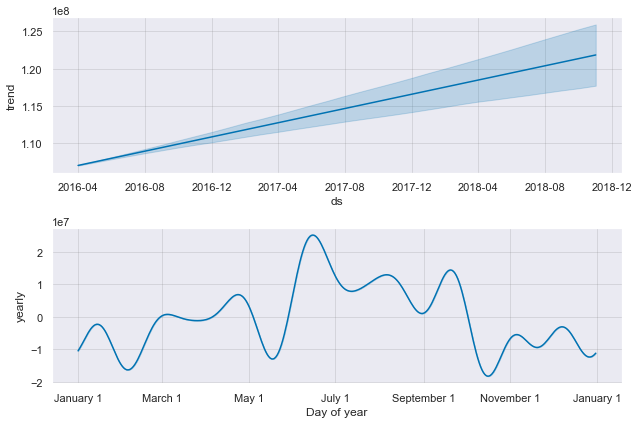

In [153]:
Model.plot_components(forecast)
plt.show()

# Interactive Visualisation of Prophet using Plotly

In [154]:
from fbprophet.plot import plot_plotly
import plotly.offline as py
py.init_notebook_mode()

"""This returns the plotly figure"""
fig = plot_plotly(Model, forecast)
fig

py.iplot(fig)

# Model For Each City With Prophet


In [155]:
newdf = df1[df1['city'] == city]
newdf = df1.rename(columns={'PASSENGERS':'y'})

size = int(len(newdf) * 0.7)
train, test = newdf[['ds','y']][0:size], newdf[['ds','y']][size:len(newdf)]

#pd.DataFrame(train)
test

,ds,y
3477,2016-04-01,5925051
3478,2016-04-01,1268336
3479,2016-04-01,3537628
3480,2016-04-01,3605409
3481,2016-04-01,1519216
...,...,...
4963,2018-12-01,3794306
4964,2018-12-01,1295947
4965,2018-12-01,3491734
4966,2018-12-01,3491734


In [156]:
start=len(train)
end=len(train)+len(test)-1

pd.DataFrame(df1.reset_index()['ds'][start:end])

,ds
3477,2016-04-01
3478,2016-04-01
3479,2016-04-01
3480,2016-04-01
3481,2016-04-01
...,...
4962,2018-12-01
4963,2018-12-01
4964,2018-12-01
4965,2018-12-01


# Predictions Using Prophet

In [157]:
def fit_predict_prophet(df1, city):
    df1 = df1[df1['city'] == city]
    df1 = df1.rename(columns={'PASSENGERS': 'y'})
    
    size = int(len(df1) * 0.7)
    train, test = df1[['ds','y']][0:size], df1[['ds','y']][size:len(df1)]
#     train_exog, test_exog = df1[0:size], df1[size:len(df1)]
    
    train.reset_index(inplace=True)
    test.reset_index(inplace=True)
    
    start=len(train)
    end=len(train)+len(test)-1
    
#     endog = train_exog['y']
#     exog = train_exog[['temperature_mean']]
    
    Model = pr(daily_seasonality = False, yearly_seasonality = True, weekly_seasonality = False,
                seasonality_mode = 'multiplicative', 
                interval_width = 0.90,
                changepoint_range = 0.8)
    Model.fit(train)
    
    forecast = Model.predict(pd.DataFrame(df1.reset_index()['ds'][start-1:end]))
    forecast.head()
    Model.plot(forecast, uncertainty=True)
    
    from fbprophet.plot import plot_plotly
    import plotly.offline as py
    py.init_notebook_mode()

    fig = plot_plotly(Model, forecast)  # This returns a plotly Figure
    
    rms = sqrt(mean_squared_error(test['y'], forecast.loc[:, 'yhat']))
    print(rms)

    return fig

#     py.iplot(fig)
    

55041.52987777685


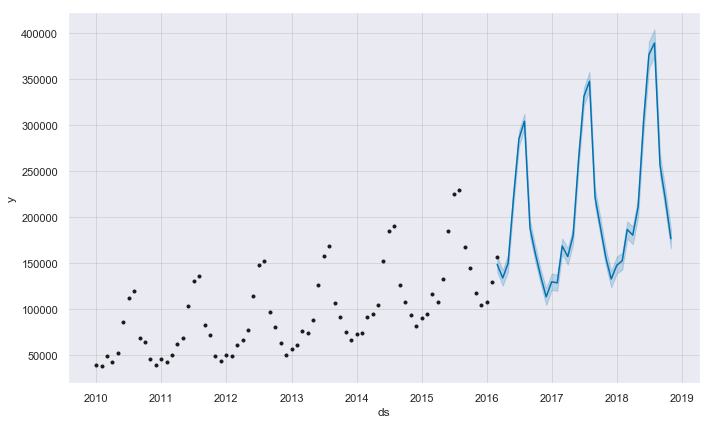

In [158]:
fit_predict_prophet(df1 , 'Reykjavik')

# Future Predictions With Prophet

In [159]:
def fit_predict_prophet_future(df1, city):
    df1 = df1[df1['city'] == city]
    df1 = df1.rename(columns={'PASSENGERS': 'y'})
    
    size = int(len(df1) * 0.7)
    train, test = df1['y'][0:size], df1['y'][size:len(df1)]
#     train_exog, test_exog = df[0:size], df[size:len(df)]
    
    endog = train_exog['y']
    exog = train_exog[['temperature_mean']]
    
    Model = pr(interval_width=0.90)
    Model.fit(df1)
    
    forecast = Model.predict(pd.DataFrame(df1.reset_index()['ds'][start:end]))
    forecast.head()
    Model.plot(forecast, uncertainty=True)
    plt.show()
    
    # USe make_future_dataframe with a monthly frequency and periods = 36 for 3 years
    future_dates = Model.make_future_dataframe(periods=36, freq='MS')
    
    forecast = Model.predict(future_dates)

In [160]:
Model = pr(interval_width=0.95)

In [161]:
Model.fit(prophetdf)

INFO:fbprophet:Disabling weekly seasonality. Run prophet with weekly_seasonality=True to override this.
INFO:fbprophet:Disabling daily seasonality. Run prophet with daily_seasonality=True to override this.


In [ ]:
# USe make_future_dataframe with a monthly frequency and periods = 36 for 3 years

In [162]:
future_dates = Model.make_future_dataframe(periods=36, freq='MS')

In [163]:
# forecasting 
forecast = Model.predict(future_dates)
forecast.head()


,ds,trend,yhat_lower,yhat_upper,trend_lower,trend_upper,additive_terms,additive_terms_lower,additive_terms_upper,yearly,yearly_lower,yearly_upper,multiplicative_terms,multiplicative_terms_lower,multiplicative_terms_upper,yhat
0,2010-01-01,1.830412e+06,-1.406579e+06,4.830206e+06,1.830412e+06,1.830412e+06,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,0.0,0.0,0.0,1.579659e+06
1,2010-01-01,1.830412e+06,-1.236271e+06,4.426569e+06,1.830412e+06,1.830412e+06,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,0.0,0.0,0.0,1.579659e+06
2,2010-01-01,1.830412e+06,-1.172936e+06,4.643366e+06,1.830412e+06,1.830412e+06,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,0.0,0.0,0.0,1.579659e+06
3,2010-01-01,1.830412e+06,-1.504043e+06,4.561761e+06,1.830412e+06,1.830412e+06,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,0.0,0.0,0.0,1.579659e+06
4,2010-01-01,1.830412e+06,-1.431742e+06,4.301941e+06,1.830412e+06,1.830412e+06,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,-250753.199014,0.0,0.0,0.0,1.579659e+06
